In [1]:
import funcs
import mrsobs

import itertools
import numpy as np
from astropy.io import fits
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

In [2]:
%autosave 30

Autosaving every 30 seconds


In [3]:
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
d2cMapDir = workDir+'notebooks/distortionMaps/'
lvl1path = workDir+'CV3_data/LVL1/'
lvl2path = workDir+'CV3_data/LVL2/'

In [4]:
# select band
band = '4C'

# The non-linearity correction is described by a n-th order polynomial, define the order here, as well as the integration ramp to be used
order = 4
analyze_ramp = 1

# define frames in ramp to skip
skip_first = 3
skip_last  = 1

In [5]:
# # CV3 MIRM33541 (MRS_RAD_11, observations of internal calibration source in nominal and cross-dichroic configurations)
# filename = mrsobs.MIRI_internal_calibration_source(lvl1path,band,campaign='CV3',output='filename').replace('_LVL2','')
# CV3 MIRM108 (MRS_RAD_14, ramps purposed for non-linearity correction)
filename = mrsobs.MIRI_internal_calibration_source_nonlinearity_correction(lvl1path,band,output='filename').replace('_LVL2','')

image_hdu = fits.open(filename)
image_data = fits.getdata(filename)[:,:1024,:].astype('float')

In [6]:
image_shape = image_data.shape
nints       = image_hdu[0].header['NINT']
ngroups     = image_hdu[0].header['NGROUP']
nframes     = image_shape[0]
readout     = image_hdu[0].header['READOUT']
frame_delta_time = image_hdu[0].header['TFRAME']
print('Number of integrations: {}'.format(nints))
print('Number of groups/frames per integration: {}'.format(ngroups))
print('Total number of frames: {}'.format(nframes))
print('Readout: {}'.format(readout))
print('Time between samples: {} sec'.format(frame_delta_time))
print('LVL1 data shape: {}'.format(image_shape))

Number of integrations: 2
Number of groups/frames per integration: 200
Total number of frames: 400
Readout: FAST
Time between samples: 2.77504 sec
LVL1 data shape: (400, 1024, 1032)


In [7]:
image_hdu.close()

<IPython.core.display.Javascript object>


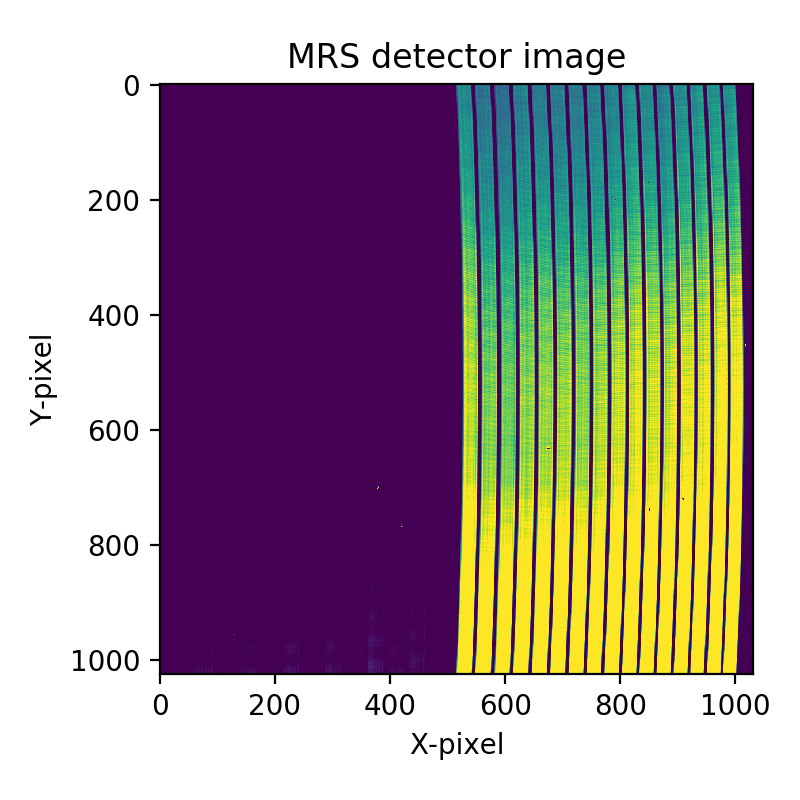

<IPython.core.display.Javascript object>


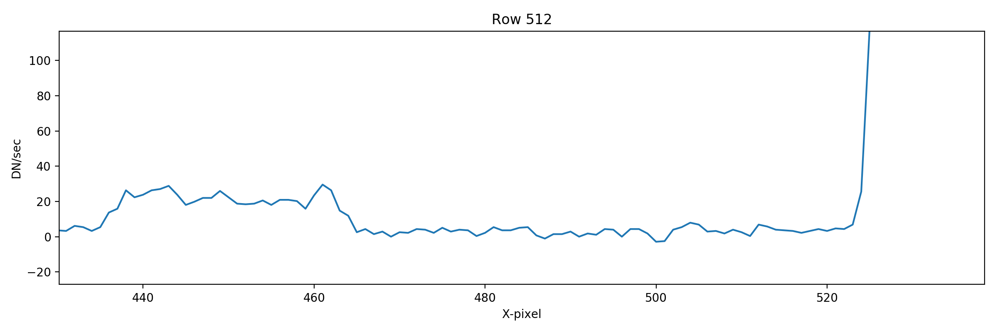

In [16]:
slope_img = (image_data[3,:,:]-image_data[2,:,:])/frame_delta_time
plt.figure(figsize=(4,4))
plt.imshow(slope_img,vmin=100,vmax=700)
plt.xlabel('X-pixel')
plt.ylabel('Y-pixel')
plt.title('MRS detector image')
plt.tight_layout()

row = 512
plt.figure(figsize=(12,4))
if band[0] in ['1','4']:
    plt.plot(slope_img[row,:])
elif band[0] in ['2','3']:
    plt.plot(slope_img[row,:])
plt.xlabel('X-pixel')
plt.ylabel('DN/sec')
plt.title('Row {}'.format(row))
plt.tight_layout()

<IPython.core.display.Javascript object>


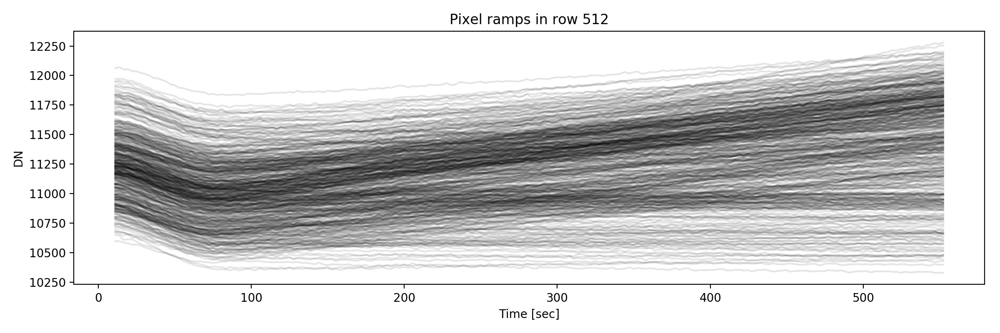

In [9]:
plt.close('all')

if band[0] in ['1','4']:
    range_x = range(10,512)
elif band[0] in ['2','3']:
    range_x = range(512,1020)

plt.figure(figsize=(12,4))
for ypos in [10]:
    for xpos in range_x:
        time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
        tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
        time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
        time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]
        plt.plot(time3,tramp3,'k',alpha=0.1)
plt.xlabel('Time [sec]')
plt.ylabel('DN')
plt.title('Pixel ramps in row {}'.format(row))
plt.tight_layout()

In [10]:
plt.close('all')

In [11]:
# initialize placeholders
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

print('Output parameters (object shape): {}'.format(out_parameters.shape))
print('Count rate at 0DN (object shape): {}'.format(count_rate_at_0DN.shape))

Output parameters (object shape): (5, 1024, 1032)
Count rate at 0DN (object shape): (1024, 1032)


## Derive non-linearity correction for a single pixel

<IPython.core.display.Javascript object>


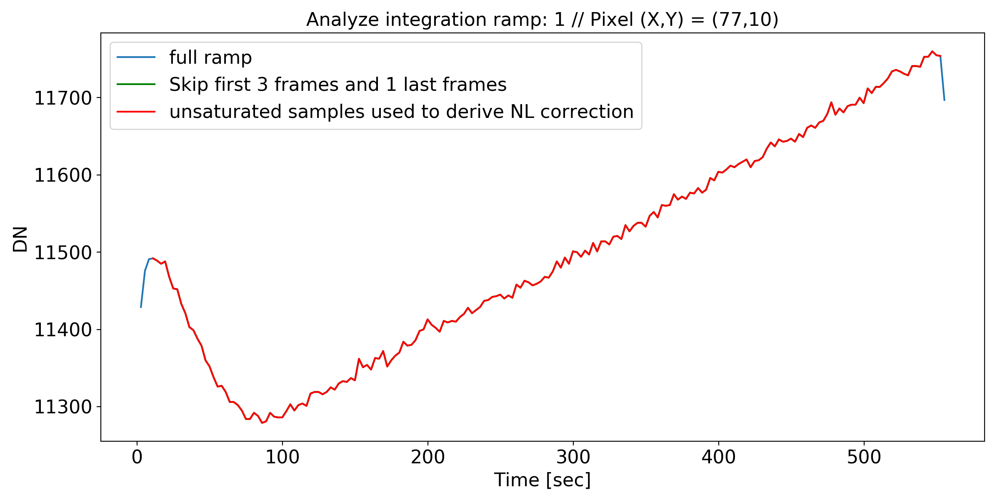

In [19]:
# Define ramp to be used for derivation of non-linearity correction
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)

row = 10
ypos,xpos = trace_y[row],trace_x[row]

time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

plt.figure(figsize=(12,6))
plt.plot(time,tramp,label='full ramp')
plt.plot(time2,tramp2,'g',label='Skip first {} frames and {} last frames'.format(skip_first,skip_last))
plt.plot(time3,tramp3,'r',label='unsaturated samples used to derive NL correction')
plt.xlabel('Time [sec]',fontsize=16)
plt.ylabel('DN',fontsize=16)
plt.legend(fontsize=16)
plt.title('Analyze integration ramp: {} // Pixel (X,Y) = ({},{})'.format(analyze_ramp,xpos,ypos),fontsize=16)
plt.tick_params(axis='both',labelsize=16)
plt.tight_layout()

<IPython.core.display.Javascript object>


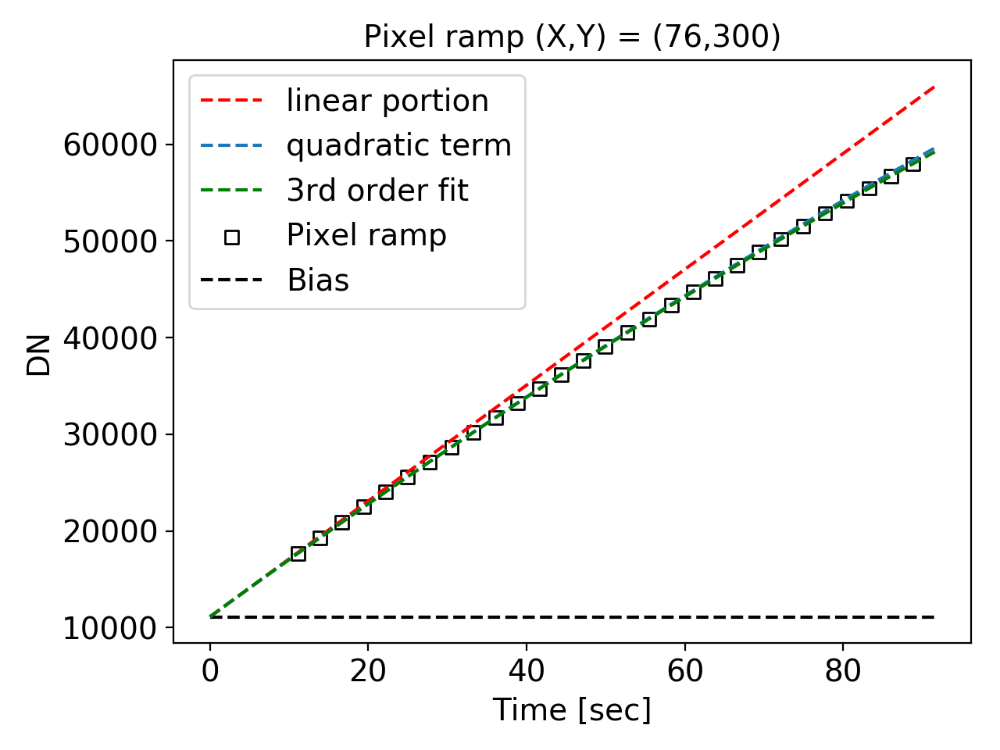

<IPython.core.display.Javascript object>


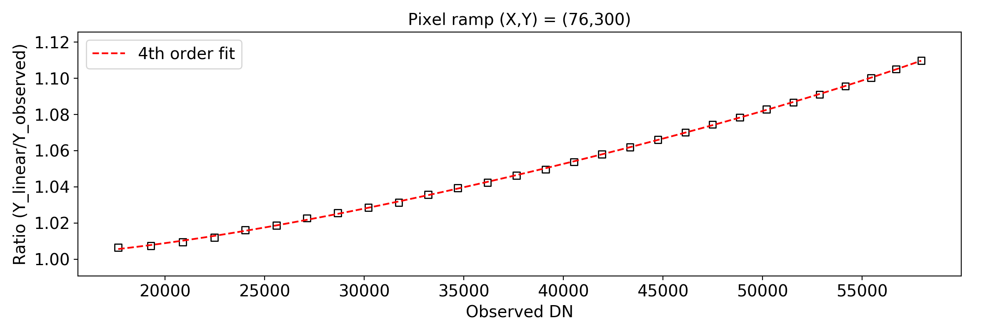

In [14]:
# derive non-linearity correction
intime = time3
inramp = tramp3

num_samples = inramp.size
first_fit_order = 3
assert num_samples > order + 3, 'Not enough samples to derive a non-linearity correction'

if first_fit_order == 2:
    bias,linear_term,quad_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)
elif first_fit_order == 3:
    bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)
elif first_fit_order == 4:
    bias,linear_term,quad_term,cubic_term,fourth_order_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

expected_rate = linear_term
expected_DN = bias+linear_term*intime

time_array = np.arange(skip_first+len(inramp)+skip_last+1)*frame_delta_time
plt.figure()
plt.scatter(intime,inramp,marker='s',facecolors='none',edgecolors='k',label='Pixel ramp')
plt.hlines(bias,0,time_array[-1],'k',linestyle='dashed',label='Bias')
plt.plot(time_array,bias+linear_term*time_array,'r',label='linear portion',linestyle='dashed')
plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2,label='quadratic term',linestyle='dashed')
if first_fit_order == 3:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3,'g',label='3rd order fit',linestyle='dashed')
elif first_fit_order == 4:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3+fourth_order_term*time_array**4,'g',label='4th order fit',linestyle='dashed')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

# now get the ratio between the expected DN and the actual DN. 
# This is the correction factor.
correction_factor = expected_DN/inramp
assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

#solve for the correction factor as a function of observed DN.
coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)
poly = np.poly1d(coefs[::-1])

ramp = np.linspace(inramp[0],inramp[-1],1000)
plt.figure(figsize=(12,4))
plt.scatter(inramp,correction_factor,marker='s',facecolors='none',edgecolors='k')
plt.plot(ramp,coefs[0]+coefs[1]*ramp+coefs[2]*ramp**2+coefs[3]*ramp**3+coefs[4]*ramp**4,'r',label='4th order fit',linestyle='dashed')
plt.xlabel('Observed DN',fontsize=14)
plt.ylabel('Ratio (Y_linear/Y_observed)',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

In [15]:
# insert results in placeholder array
out_parameters[:, ypos,xpos] = coefs
count_rate_at_0DN[ypos,xpos] = expected_rate

In [16]:
# apply correction
# define placeholders
out_ramp = np.zeros_like(inramp, dtype=np.float64)
new_rate = np.zeros(shape=(len(inramp)-1, image_shape[1], image_shape[2]), dtype=np.float64)

print('Output ramp (object shape): {}'.format(out_ramp.shape))
print('New rate (object shape): {}'.format(new_rate.shape))

Output ramp (object shape): (29,)
New rate (object shape): (28, 1024, 1032)


<IPython.core.display.Javascript object>


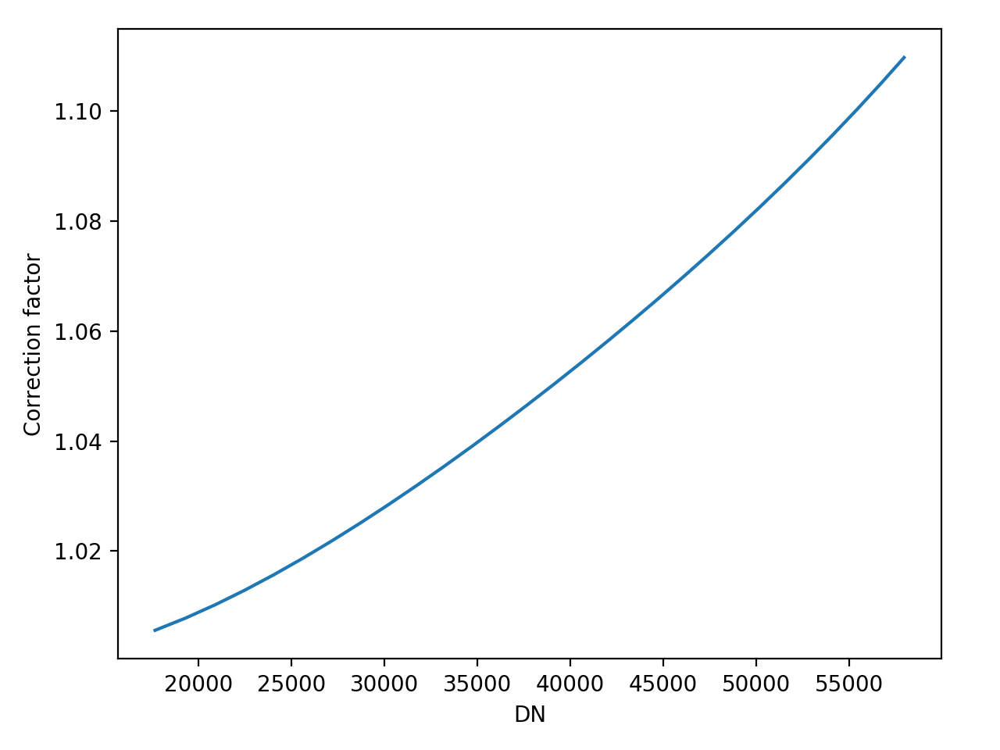

<IPython.core.display.Javascript object>


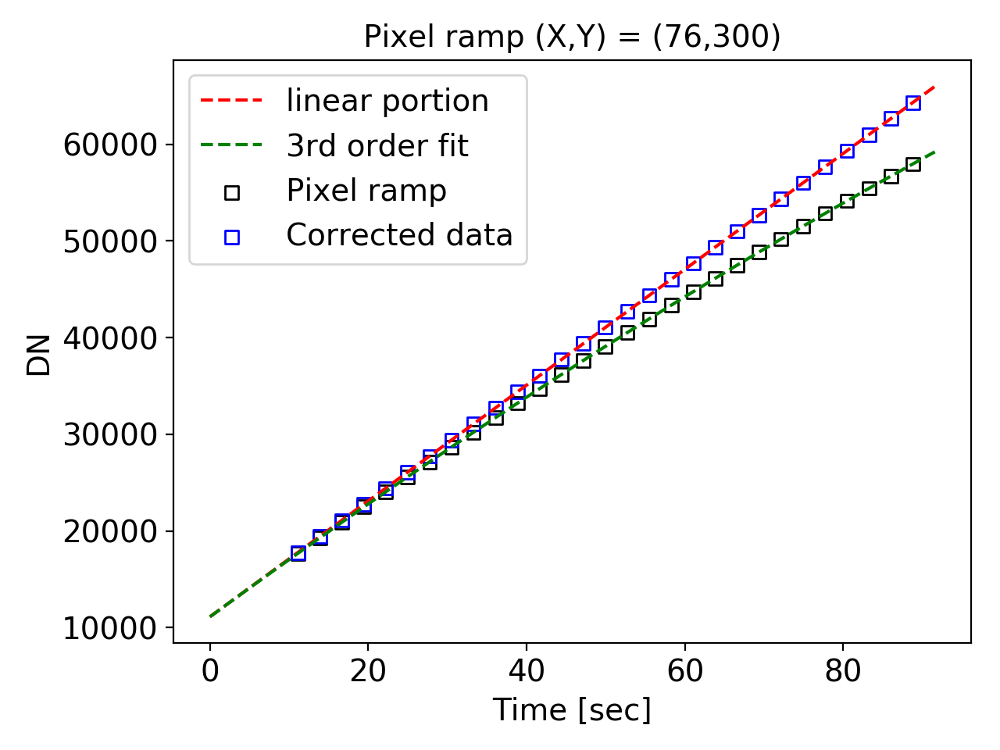

<IPython.core.display.Javascript object>


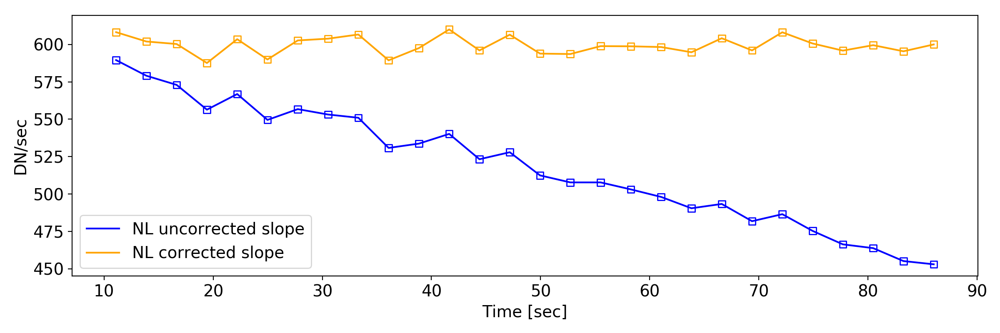

In [17]:
cor_factor = np.polynomial.polynomial.polyval(inramp, out_parameters[:, ypos, xpos])

plt.figure()
plt.plot(inramp,cor_factor)
plt.xlabel('DN')
plt.ylabel('Correction factor')
plt.tight_layout()

# correct ramp by applying derived NL correction
corrected_ramp = cor_factor * inramp

time_array = np.arange(skip_first+len(inramp)+skip_last+1)*frame_delta_time
plt.figure()
plt.scatter(intime,inramp,marker='s',facecolors='none',edgecolors='k',label='Pixel ramp')
plt.scatter(intime,corrected_ramp,marker='s',facecolors='none',edgecolors='b',label='Corrected data')
plt.plot(time_array,bias+linear_term*time_array,'r',label='linear portion',linestyle='dashed')
if first_fit_order == 3:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3,'g',label='3rd order fit',linestyle='dashed')
elif first_fit_order == 4:
    plt.plot(time_array,bias+linear_term*time_array+quad_term*time_array**2+cubic_term*time_array**3+fourth_order_term*time_array**4,'g',label='4th order fit',linestyle='dashed')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN',fontsize=14)
plt.legend(fontsize=14)
plt.title('Pixel ramp (X,Y) = ({},{})'.format(xpos,ypos),fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

new_rate_DN = np.diff(corrected_ramp)
new_rate[:, ypos, xpos] = new_rate_DN

plt.figure(figsize=(12,4))
plt.scatter(intime[:-1],np.diff(inramp)/frame_delta_time,marker='s',facecolors='none',edgecolors='b')
plt.plot(intime[:-1],np.diff(inramp)/frame_delta_time,'b',label='NL uncorrected slope')
plt.scatter(intime[:-1],new_rate_DN/frame_delta_time,marker='s',facecolors='none',edgecolors='orange')
plt.plot(intime[:-1],new_rate_DN/frame_delta_time,'orange',label='NL corrected slope')
plt.xlabel('Time [sec]',fontsize=14)
plt.ylabel('DN/sec',fontsize=14)
plt.legend(fontsize=14)
plt.tick_params(axis='both',labelsize=14)
plt.tight_layout()

## Derive non-linearity correction for a single trace in MRS slice

In [18]:
# initialize placeholders
bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
for i in range(1024):
    if i%100 == 0:
        print 'Row {}'.format(i)
    ypos,xpos = trace_y[i],trace_x[i]
    time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
    tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
    time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
    time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

    # derive non-linearity correction
    intime = time3
    inramp = tramp3

    num_samples = inramp.size
    first_fit_order = 3
    assert num_samples > order + 3, 'Not enough samples to derive a non-linearity correction'
    
    bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

    expected_rate = linear_term
    expected_DN = bias+linear_term*intime

    # now get the ratio between the expected DN and the actual DN. 
    # This is the correction factor.
    correction_factor = expected_DN/inramp
    
    assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

    #solve for the correction factor as a function of observed DN.
    coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

    # insert results in placeholder array
    bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
    out_parameters[:, ypos,xpos] = coefs
    count_rate_at_0DN[ypos,xpos] = expected_rate

Row 0
Row 100
Row 200
Row 300
Row 400
Row 500
Row 600
Row 700
Row 800
Row 900
Row 1000


------FIT PARAMETERS OF PIXEL RAMPS------


<IPython.core.display.Javascript object>


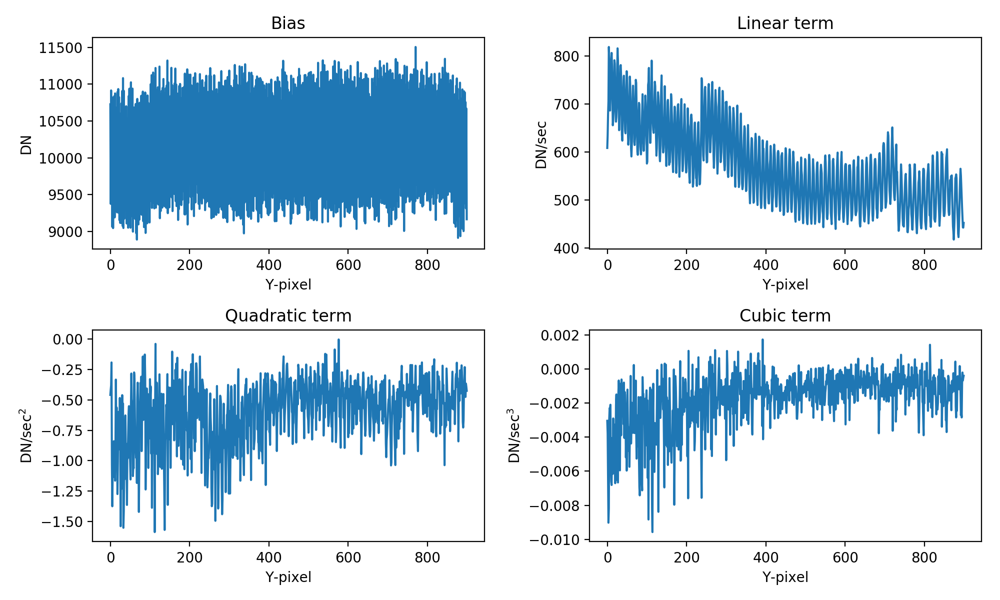

------FIT PARAMETERS OF CORRECTION CURVE------


<IPython.core.display.Javascript object>


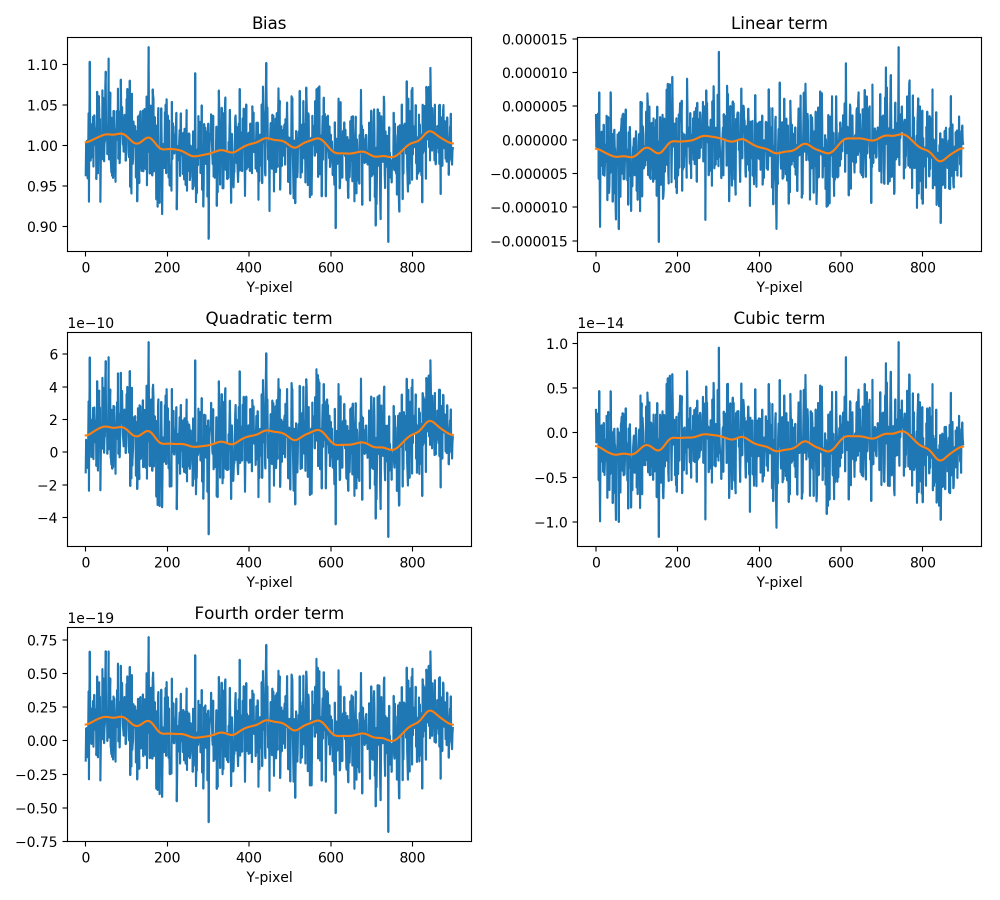

In [27]:
plt.close('all')

trace_y_cut,trace_x_cut = trace_y[50:950],trace_x[50:950]

print '------FIT PARAMETERS OF PIXEL RAMPS------'
fig,axs = plt.subplots(2,2,figsize=(10,6))
axs[0,0].plot(bias_map[trace_y_cut,trace_x_cut])
axs[0,0].set_ylabel('DN')
axs[0,0].set_title('Bias')
axs[0,1].plot(linear_term_map[trace_y_cut,trace_x_cut])
axs[0,1].set_ylabel('DN/sec')
axs[0,1].set_title('Linear term')
axs[1,0].plot(quad_term_map[trace_y_cut,trace_x_cut])
axs[1,0].set_ylabel(r'DN/sec$^2$')
axs[1,0].set_title('Quadratic term')
axs[1,1].plot(cubic_term_map[trace_y_cut,trace_x_cut])
axs[1,1].set_ylabel(r'DN/sec$^3$')
axs[1,1].set_title('Cubic term')
for i,j in itertools.product(range(2),range(2)):
    axs[i,j].set_xlabel(r'Y-pixel')
plt.tight_layout()

print '------FIT PARAMETERS OF CORRECTION CURVE------'
sigma_smooth = 15
fig,axs = plt.subplots(3,2,figsize=(10,9))
axs[0,0].plot(out_parameters[0,trace_y_cut,trace_x_cut])
axs[0,0].plot(gaussian_filter1d(out_parameters[0,trace_y_cut,trace_x_cut],sigma_smooth))
axs[0,0].set_title('Bias')
axs[0,1].plot(out_parameters[1,trace_y_cut,trace_x_cut])
axs[0,1].plot(gaussian_filter1d(out_parameters[1,trace_y_cut,trace_x_cut],sigma_smooth))
axs[0,1].set_title('Linear term')
axs[1,0].plot(out_parameters[2,trace_y_cut,trace_x_cut])
axs[1,0].plot(gaussian_filter1d(out_parameters[2,trace_y_cut,trace_x_cut],sigma_smooth))
axs[1,0].set_title('Quadratic term')
axs[1,1].plot(out_parameters[3,trace_y_cut,trace_x_cut])
axs[1,1].plot(gaussian_filter1d(out_parameters[3,trace_y_cut,trace_x_cut],sigma_smooth))
axs[1,1].set_title('Cubic term')
axs[2,0].plot(out_parameters[4,trace_y_cut,trace_x_cut])
axs[2,0].plot(gaussian_filter1d(out_parameters[4,trace_y_cut,trace_x_cut],sigma_smooth))
axs[2,0].set_title('Fourth order term')
fig.delaxes(axs[2,1])
for i,j in itertools.product(range(3),range(2)):
    axs[i,j].set_xlabel(r'Y-pixel')
plt.tight_layout()

## Derive non-linearity correction for full MRS detector

In [ ]:
# initialize placeholders
bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)
count_rate_at_0DN = np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64)

d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
for ypos,xpos in itertools.product(range(1024),range(512)):
    if (xpos==511) & (ypos%100 == 0):
        print 'Row {}'.format(ypos)
    if d2cMaps['sliceMap'][ypos,xpos] != 0:
        try:
            time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
            if analyze_ramp != 1:
                time = time-time[0]+frame_delta_time
            tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
            time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
            time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

            # derive non-linearity correction
            intime = time3
            inramp = tramp3

            num_samples = inramp.size
            first_fit_order = 3
            assert (num_samples > order + 3), 'Not enough samples for pixel (X,Y) = ({},{}) to derive a non-linearity correction'.format(xpos,ypos)

            bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

            expected_rate = linear_term
            expected_DN = bias+linear_term*intime

            # now get the ratio between the expected DN and the actual DN. 
            # This is the correction factor.
            correction_factor = expected_DN/inramp
            assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

            #solve for the correction factor as a function of observed DN.
            coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

            # insert results in placeholder array
            bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
            out_parameters[:, ypos,xpos] = coefs
            count_rate_at_0DN[ypos,xpos] = expected_rate
        except:
            pass

Row 0
Row 100


<IPython.core.display.Javascript object>


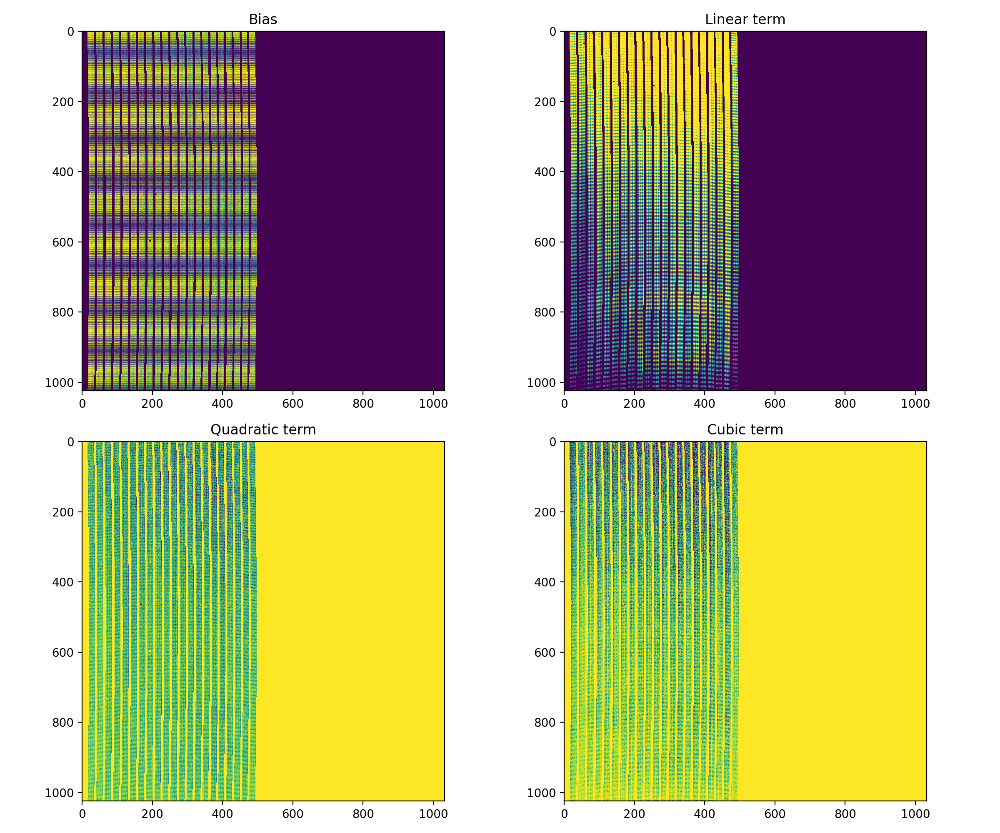

In [28]:
plt.close('all')
fig,axs = plt.subplots(2,2,figsize=(12,10))
axs[0,0].imshow(bias_map,vmin=9000,vmax=11000)
axs[0,0].set_title('Bias')
axs[0,1].imshow(linear_term_map,vmin=500,vmax=700)
axs[0,1].set_title('Linear term')
axs[1,0].imshow(quad_term_map,vmin=-2,vmax=0)
axs[1,0].set_title('Quadratic term')
axs[1,1].imshow(cubic_term_map,vmin=-0.01,vmax=0.)
axs[1,1].set_title('Cubic term')
plt.tight_layout()

# Quadratic term shows imprint of fringes; this is most likely due to the DN dependence of the non-linearity. 
# On a fringe peak the DN are higher thus the non-linearity is more severe and the ramp is more bent (and vice-versa for a fringe peak trough).

<IPython.core.display.Javascript object>


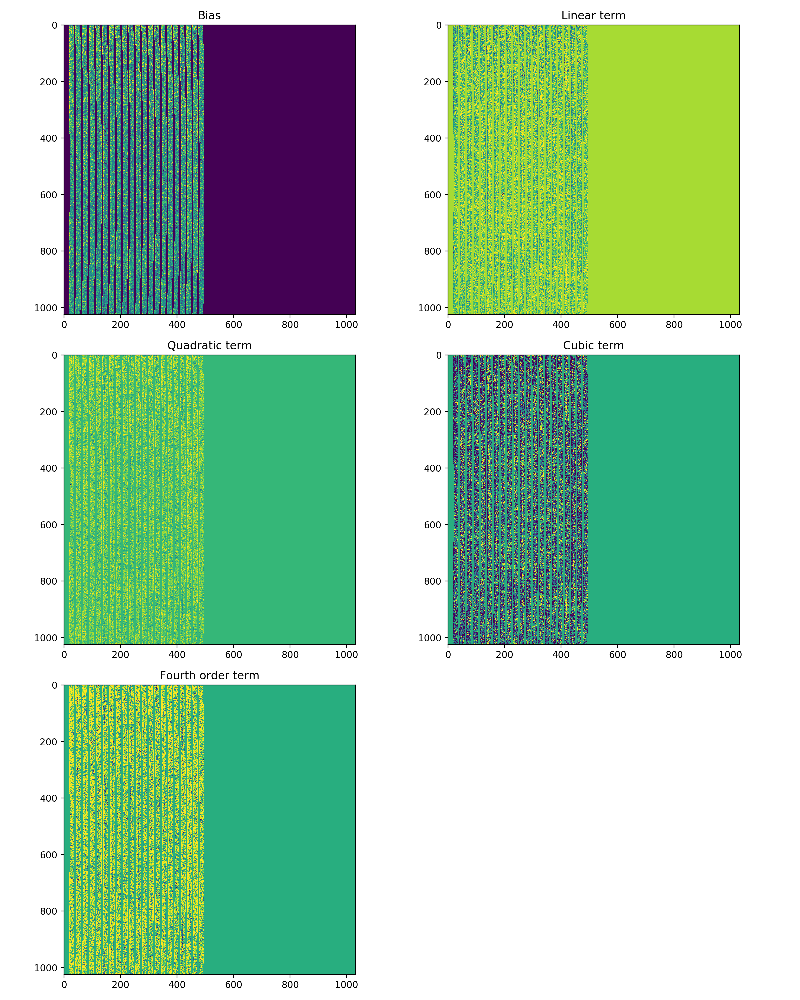

In [29]:
plt.close('all')
fig,axs = plt.subplots(3,2,figsize=(12,15))
axs[0,0].imshow(out_parameters[0, :, :],vmin=0.9,vmax=1.1)
axs[0,0].set_title('Bias')
axs[0,1].imshow(out_parameters[1, :, :]*1e6,vmin=-20,vmax=3)
axs[0,1].set_title('Linear term')
axs[1,0].imshow(out_parameters[2, :, :]*1e10,vmin=-10,vmax=5)
axs[1,0].set_title('Quadratic term')
axs[1,1].imshow(out_parameters[3, :, :]*1e15,vmin=-5,vmax=3)
axs[1,1].set_title('Cubic term')
axs[2,0].imshow(out_parameters[4, :, :]*1e20,vmin=-5,vmax=3)
axs[2,0].set_title('Fourth order term')
fig.delaxes(axs[2][1])
plt.tight_layout()

In [128]:
outfile = 'NonLinearityCorrection_OutputParameters_CV3_MRS_RAD_14_Band{}'.format(band)
np.save(outfile, out_parameters)

In [ ]:
# out_parameters = np.load(outfile)

In [30]:
# out_parameters_dic = {}
# out_parameters_dic[band] = out_parameters

# Multi-band analysis

In [30]:
out_parameters_dic = {}

for band in ['1A','1B','1C','2A','2B','2C','3A','3B','3C','4A','4B','4C']:
    print 'Band {}'.format(band)
    # CV3 MIRM108 (MRS_RAD_14, ramps purposed for non-linearity correction)
    filename = mrsobs.MIRI_internal_calibration_source_nonlinearity_correction(lvl1path,band,output='filename').replace('_LVL2','')
    
    image_hdu = fits.open(filename)
    image_data = fits.getdata(filename)[:,:1024,:].astype('float')

    #
    image_shape = image_data.shape
    nints       = image_hdu[0].header['NINT']
    ngroups     = image_hdu[0].header['NGROUP']
    nframes     = image_shape[0]
    frame_delta_time = image_hdu[0].header['TFRAME']

    # initialize placeholders
    bias_map,linear_term_map,quad_term_map,cubic_term_map = [np.zeros(shape =(image_shape[1], image_shape[2] ), dtype=np.float64) for i in range(4)]
    out_parameters = np.zeros(shape =(order + 1, image_shape[1], image_shape[2] ), dtype=np.float64)

    d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
    trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
    for i in range(1024):
        ypos,xpos = trace_y[i],trace_x[i]
        time  = np.arange(1,nframes+1)[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups]*frame_delta_time
        tramp = image_data[(analyze_ramp-1)*ngroups:analyze_ramp*ngroups,ypos,xpos]
        time2,tramp2 = time[skip_first:-skip_last],tramp[skip_first:-skip_last]
        time3,tramp3 = time2[tramp2 < 58000],tramp2[tramp2 < 58000]

        # derive non-linearity correction
        intime = time3
        inramp = tramp3

        num_samples = inramp.size
        first_fit_order = 3
        if num_samples <= order + 3:
            continue

        bias,linear_term,quad_term,cubic_term = np.polynomial.polynomial.polyfit(intime, inramp, first_fit_order)

        expected_rate = linear_term
        expected_DN = expected_rate * (intime-intime[0]) + inramp[0]

        # now get the ratio between the expected DN and the actual DN. 
        # This is the correction factor.
        correction_factor = expected_DN/inramp
        assert np.sum(np.isfinite(correction_factor)) == correction_factor.size, 'There are non legal values in the correction factor array'

        #solve for the correction factor as a function of observed DN.
        coefs = np.polynomial.polynomial.polyfit(inramp, correction_factor, order)

        # insert results in placeholder array
        bias_map[ypos,xpos],linear_term_map[ypos,xpos],quad_term_map[ypos,xpos],cubic_term_map[ypos,xpos] = bias,linear_term,quad_term,cubic_term
        out_parameters[:, ypos,xpos] = coefs

    out_parameters_dic[band] = out_parameters

Band 1A
Band 1B
Band 1C
Band 2A
Band 2B
Band 2C
Band 3A
Band 3B
Band 3C
Band 4A
Band 4B
Band 4C


<IPython.core.display.Javascript object>


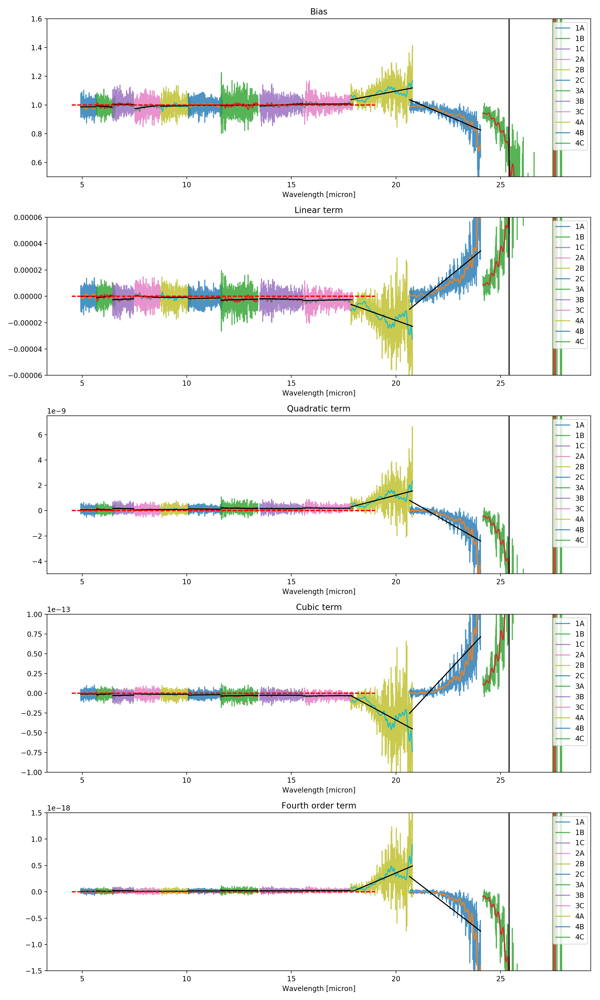

In [31]:
plt.close('all')

fig,axs = plt.subplots(5,1,figsize=(12,20))
bands = ['1A','1B','1C','2A','2B','2C','3A','3B','3C','4A','4B','4C']
for i,band in enumerate(bands):
    xaxis   = i*len(np.arange(1024)[50:950])+np.arange(1024)[50:950]
    d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
    trace_y,trace_x = funcs.detpixel_trace(band,d2cMaps,sliceID=d2cMaps['nslices']/2,alpha_pos=0.)
    
    trace_y,trace_x = trace_y[50:950],trace_x[50:950]
    
    first_order_fit_bias = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][0,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_linear = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][1,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_quad = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][2,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_cubic = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][3,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    first_order_fit_fourth = np.poly1d(np.polyfit(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][4,trace_y,trace_x],1))(d2cMaps['lambdaMap'][trace_y,trace_x])
    
    sigma_smooth = 10
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][0,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][0,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[0].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_bias,'k',zorder=0)
    axs[0].set_ylim(0.5,1.6)
    axs[0].hlines(1,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[0].set_title('Bias')
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][1,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][1,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[1].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[1].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_linear,'k',zorder=0)
    axs[1].set_ylim(-0.00006,0.00006)
    axs[1].set_title('Linear term')
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][2,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][2,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[2].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[2].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_quad,'k',zorder=0)
    axs[2].set_ylim(-0.5*10**-8,0.75*10**-8)
    axs[2].set_title('Quadratic term')
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][3,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][3,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[3].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[3].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_cubic,'k',zorder=0)
    axs[3].set_ylim(-1e-13,1e-13)
    axs[3].set_title('Cubic term')
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],out_parameters_dic[band][4,trace_y,trace_x],alpha=0.8,zorder=0,label=band)
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],gaussian_filter1d(out_parameters_dic[band][4,trace_y,trace_x],sigma_smooth),zorder=0)
    axs[4].hlines(0,4.5,19,'r',linestyle='dashed',zorder=1)
    axs[4].plot(d2cMaps['lambdaMap'][trace_y,trace_x],first_order_fit_fourth,'k',zorder=0)
    axs[4].set_ylim(-1.5*10**-18,1.5*10**-18)
    axs[4].set_title('Fourth order term')
for plot in range(5):
    axs[plot].set_xlabel(r'Wavelength [micron]')
    axs[plot].legend()
plt.tight_layout()

In [27]:
VDDUC_dic,VDETCOM_dic,VSSOUT_dic,VBIAS_dic = {},{},{},{}

for band in ['1A','1B','1C','3A','3B','3C']:
    print 'Band {}'.format(band)
#     # CV3 MIRM33541 (MRS_RAD_11, observations of internal calibration source in nominal and cross-dichroic configurations)
#     filename = mrsobs.MIRI_internal_calibration_source(lvl1path,band,campaign='CV3',output='filename').replace('_LVL2','')
    # CV3 MIRM108 (MRS_RAD_14, ramps purposed for non-linearity correction)
    filename = mrsobs.MIRI_internal_calibration_source_nonlinearity_correction(lvl1path,band,output='filename').replace('_LVL2','')
    image_hdu = fits.open(filename)
    
    VDDUC,VDETCOM,VSSOUT = [],[],[]
    for i in range(len(image_hdu[1].data)):
        if image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VDDUC','IGDP_MIR_LW_V_VDDUC']:
            VDDUC.append(float(image_hdu[1].data[i][2]))
        elif image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VDETCOM','IGDP_MIR_LW_V_VDETCOM']:
            VDETCOM.append(float(image_hdu[1].data[i][2]))
        elif image_hdu[1].data[i][1] in ['IGDP_MIR_SW_V_VSSOUT','IGDP_MIR_LW_V_VSSOUT']:
            VSSOUT.append(float(image_hdu[1].data[i][2]))
    VDDUC,VDETCOM,VSSOUT = np.array(VDDUC),np.array(VDETCOM),np.array(VSSOUT)

    VBIAS = (VDDUC+0.2)-VDETCOM
    
    VDDUC_dic[band] = VDDUC
    VDETCOM_dic[band] = VDETCOM
    VSSOUT_dic[band] = VSSOUT
    VBIAS_dic[band] = VBIAS
# both detector halves have same bias voltage
for band in ['2A','2B','2C','4A','4B','4C']:
    VDDUC_dic[band]   = VDDUC_dic[str(int(band[0])-1)+band[1]]
    VDETCOM_dic[band] = VDETCOM_dic[str(int(band[0])-1)+band[1]]
    VSSOUT_dic[band]  = VSSOUT_dic[str(int(band[0])-1)+band[1]]
    VBIAS_dic[band]   = VBIAS_dic[str(int(band[0])-1)+band[1]]

Band 1A
Band 1B
Band 1C
Band 3A
Band 3B
Band 3C


<IPython.core.display.Javascript object>


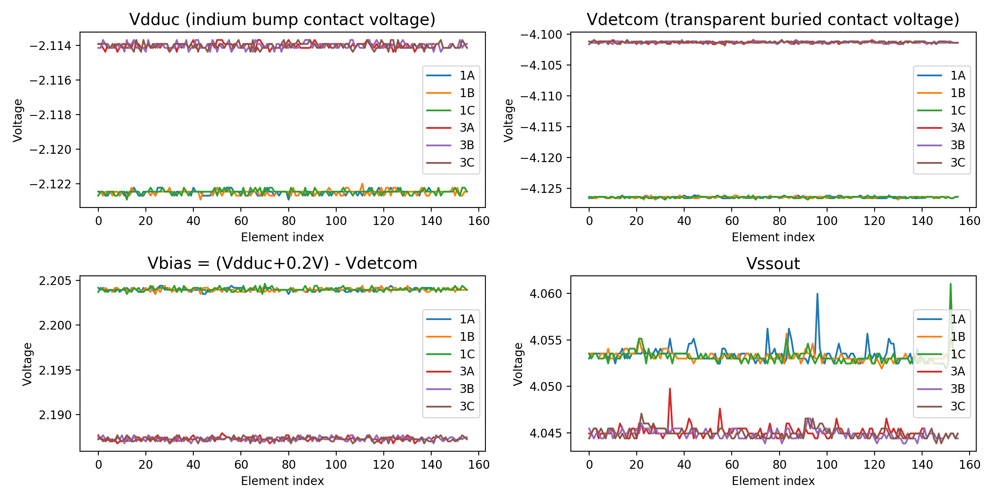

In [29]:
fig,axs = plt.subplots(2,2,figsize=(12,6))
for band in ['1A','1B','1C','3A','3B','3C']:
    axs[0,0].plot(VDDUC_dic[band],label=band)
    axs[0,1].plot(VDETCOM_dic[band],label=band)
    axs[1,0].plot(VBIAS_dic[band],label=band)
    axs[1,1].plot(VSSOUT_dic[band],label=band)
axs[0,0].set_title('Vdduc (indium bump contact voltage)',fontsize=14)
axs[0,1].set_title('Vdetcom (transparent buried contact voltage)',fontsize=14)
axs[1,0].set_title('Vbias = (Vdduc+0.2V) - Vdetcom',fontsize=14)
axs[1,1].set_title('Vssout',fontsize=14)
for i,j in itertools.product(range(2),range(2)):
    axs[i,j].set_xlabel('Element index')
    axs[i,j].set_ylabel('Voltage')
    axs[i,j].legend()
plt.tight_layout()